In [2]:
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
data_files = sorted(glob.glob("../data/*"))

In [4]:
data_files

['../data/Folsom_NAM_lat38.579454_lon-121.260320.csv',
 '../data/Folsom_NAM_lat38.599891_lon-121.126680.csv',
 '../data/Folsom_NAM_lat38.683880_lon-121.286556.csv',
 '../data/Folsom_NAM_lat38.704328_lon-121.152788.csv',
 '../data/Folsom_irradiance.csv',
 '../data/Folsom_satellite.csv',
 '../data/Folsom_sky_image_features.csv',
 '../data/Folsom_weather.csv',
 '../data/Irradiance_features_day-ahead.csv',
 '../data/Irradiance_features_intra-day.csv',
 '../data/Irradiance_features_intra-hour.csv',
 '../data/NAM_nearest_node_day-ahead.csv',
 '../data/Sat_image_features_intra-day.csv',
 '../data/Sky_image_features_intra-hour.csv',
 '../data/Target_day-ahead.csv',
 '../data/Target_intra-day.csv',
 '../data/Target_intra-hour.csv']

# Challenge: predict irradiance for the next 30 minutes at 1 minute intervals
## Use 2014/15 to train and 2016 to test

In [5]:
target = pd.read_csv("../data/Folsom_irradiance.csv")

In [5]:
target.describe().apply(lambda s: s.apply("{0:.5f}".format))

,ghi,dni,dhi
count,1552320.00000,1552320.00000,1551702.00000
mean,208.54445,259.86476,54.26736
std,295.33004,363.15687,84.32237
min,0.00000,0.00000,0.00000
25%,0.00000,0.00000,0.00000
50%,3.23000,0.00000,3.79550
75%,386.90000,662.80000,79.56000
max,1466.00000,1004.00000,748.10000


In [6]:
target.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1552320 entries, 0 to 1552319
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   timeStamp  1552320 non-null  object 
 1   ghi        1552320 non-null  float64
 2   dni        1552320 non-null  float64
 3   dhi        1551702 non-null  float64
dtypes: float64(3), object(1)
memory usage: 47.4+ MB


In [7]:
target.head()

,timeStamp,ghi,dni,dhi
0,2014-01-02 08:00:00,0.0,0.0,0.0
1,2014-01-02 08:01:00,0.0,0.0,0.0
2,2014-01-02 08:02:00,0.0,0.0,0.0
3,2014-01-02 08:03:00,0.0,0.0,0.0
4,2014-01-02 08:04:00,0.0,0.0,0.0


The term solar irradiance represents the power from the sun that reaches a surface per unit area. Direct irradiance is the part of the solar irradiance that directly reaches a surface; diffuse irradiance is the part that is scattered by the atmosphere; global irradiance is the sum of both diffuse and direct components reaching the same surface.

On the other hand, the term solar irradiation represents the sum of energy per unit area received from the sun over a specific period of time. In the Global Solar Atlas, we provide three magnitudes related to solar irradiation:

    GHI, Global Horizontal Irradiation
    DNI, Direct Normal Irradiation
    DIF, Diffuse Horizontal Irradiation

GHI and DIF are referred to a surface horizontal to the ground, while DNI is referred to a surface perpendicular to the Sun. Higher values of DIF/GHI ratio represent a higher occurrence of clouds, higher atmospheric pollution or higher water vapor content.

In [8]:
type(target.timeStamp[0])

str

In [6]:
target.timeStamp = pd.to_datetime(target.timeStamp)

In [10]:
target.timeStamp.agg(["min", "max"])

min   2014-01-02 08:00:00
max   2016-12-31 07:59:00
Name: timeStamp, dtype: datetime64[ns]

In [11]:
# the brief said a good model was obtained with image, lets look
# at the features generated from said images

In [7]:
image_processed = pd.read_csv("../data/Folsom_sky_image_features.csv")

In [13]:
image_processed.head()

,timestamp,AVG(R),STD(R),ENT(R),AVG(G),STD(G),ENT(G),AVG(B),STD(B),ENT(B),AVG(RB),STD(RB),ENT(RB),AVG(NRB),STD(NRB),ENT(NRB)
0,2014-01-01 00:00:11,102.8933,45.8083,5.6373,121.5468,39.5426,5.6390,133.4322,30.8409,5.4275,0.7457,0.1647,4.8206,-0.1554,0.1033,4.2279
1,2014-01-01 00:01:10,109.1193,44.9516,5.6762,128.0568,38.7453,5.6535,139.4049,30.2546,5.4146,0.7601,0.1547,4.7120,-0.1447,0.0953,4.0961
2,2014-01-01 00:02:10,118.4310,44.4158,5.6386,129.2313,39.1756,5.6381,134.9957,30.8004,5.4368,0.8591,0.1453,4.7299,-0.0822,0.0821,3.9662
3,2014-01-01 00:03:11,108.0799,46.3934,5.6447,129.5778,39.5050,5.6392,142.6288,30.9485,5.4369,0.7347,0.1625,4.8007,-0.1626,0.1034,4.2324
4,2014-01-01 00:04:11,106.7813,45.5549,5.6539,126.3533,39.0664,5.6438,137.2983,30.4596,5.4168,0.7541,0.1613,4.7906,-0.1494,0.1003,4.1823


In [14]:
image_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 775916 entries, 0 to 775915
Data columns (total 16 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   timestamp  775916 non-null  object 
 1   AVG(R)     775916 non-null  float64
 2   STD(R)     775916 non-null  float64
 3   ENT(R)     775916 non-null  float64
 4   AVG(G)     775916 non-null  float64
 5   STD(G)     775916 non-null  float64
 6   ENT(G)     775916 non-null  float64
 7   AVG(B)     775916 non-null  float64
 8   STD(B)     775916 non-null  float64
 9   ENT(B)     775916 non-null  float64
 10  AVG(RB)    775916 non-null  float64
 11  STD(RB)    775916 non-null  float64
 12  ENT(RB)    775916 non-null  float64
 13  AVG(NRB)   775916 non-null  float64
 14  STD(NRB)   775916 non-null  float64
 15  ENT(NRB)   775916 non-null  float64
dtypes: float64(15), object(1)
memory usage: 94.7+ MB


In [15]:
image_processed.describe()

,AVG(R),STD(R),ENT(R),AVG(G),STD(G),ENT(G),AVG(B),STD(B),ENT(B),AVG(RB),STD(RB),ENT(RB),AVG(NRB),STD(NRB),ENT(NRB)
count,775916.000000,775916.000000,775916.000000,775916.000000,775916.000000,775916.000000,775916.000000,775916.000000,775916.000000,775916.000000,775916.000000,775916.000000,775916.000000,775916.000000,775916.000000
mean,137.707012,47.618662,5.802955,141.824441,43.323574,5.692493,147.171596,36.249612,5.476716,0.919222,0.138455,4.329280,-0.049773,0.073537,3.532675
std,12.999919,6.828796,0.214288,10.191951,6.213200,0.206817,9.908800,5.722567,0.223504,0.081037,0.057342,0.541403,0.050370,0.030394,0.562946
min,64.814600,17.987500,3.820400,80.354100,15.836900,3.712900,89.490200,14.130800,3.638700,0.425400,0.000000,-0.000000,-0.462900,0.000000,-0.000000
25%,129.155500,43.600375,5.652300,134.654700,39.400200,5.553200,140.709000,32.618000,5.338100,0.883300,0.107700,4.073000,-0.069500,0.053200,3.192700
50%,139.574750,47.185800,5.765400,142.773000,43.156250,5.644700,147.631950,36.227600,5.449800,0.941000,0.134500,4.459100,-0.034400,0.067800,3.595200
75%,146.688500,51.074500,5.936000,148.652700,46.858300,5.811100,153.671400,39.853400,5.592000,0.971200,0.160300,4.703400,-0.017300,0.086500,3.932300
max,189.981700,86.451500,6.473000,189.981700,77.633900,6.470500,200.078600,83.527200,6.439500,2.166300,5.016400,6.182500,0.226300,0.323900,5.697500


In [8]:
# lets check variables for correlation
corr_image_processed = image_processed.corr().abs()
corr_image_processed[corr_image_processed > 0.5][
    corr_image_processed < 1
].style.background_gradient(cmap="turbo")

/tmp/ipykernel_229035/2321413705.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_image_processed = image_processed.corr().abs()


,AVG(R),STD(R),ENT(R),AVG(G),STD(G),ENT(G),AVG(B),STD(B),ENT(B),AVG(RB),STD(RB),ENT(RB),AVG(NRB),STD(NRB),ENT(NRB)
AVG(R),nan,0.599443,nan,0.917145,nan,nan,0.534310,nan,nan,0.751218,nan,0.676228,0.758439,0.723061,0.764767
STD(R),0.599443,nan,0.552332,0.610294,0.954014,0.559567,nan,0.735437,nan,nan,nan,nan,nan,0.685824,0.528716
ENT(R),nan,0.552332,nan,nan,0.571528,0.933143,nan,0.556546,0.719275,nan,nan,nan,nan,nan,nan
AVG(G),0.917145,0.610294,nan,nan,0.562515,nan,0.788749,nan,nan,nan,nan,0.621855,nan,0.562438,0.653129
STD(G),nan,0.954014,0.571528,0.562515,nan,0.618097,nan,0.886050,0.557194,nan,nan,nan,nan,nan,nan
ENT(G),nan,0.559567,0.933143,nan,0.618097,nan,nan,0.638294,0.873744,nan,nan,nan,nan,nan,nan
AVG(B),0.534310,nan,nan,0.788749,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
STD(B),nan,0.735437,0.556546,nan,0.886050,0.638294,nan,nan,0.728633,nan,nan,nan,nan,nan,nan
ENT(B),nan,nan,0.719275,nan,0.557194,0.873744,nan,0.728633,nan,nan,nan,nan,nan,nan,nan
AVG(RB),0.751218,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.531862,0.995034,0.768661,0.688226


In [9]:
image_processed.timestamp = pd.to_datetime(image_processed.timestamp)

In [11]:
from ydata_profiling import ProfileReport
# lets try ydata profiling
profile = ProfileReport(image_processed, title="Image Features Report")

In [12]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
%matplotlib inline
import matplotlib.pyplot as plt

In [22]:
image_processed.timestamp.agg(["min", "max"])

min   2014-01-01 00:00:11
max   2016-12-31 23:59:59
Name: timestamp, dtype: datetime64[ns]

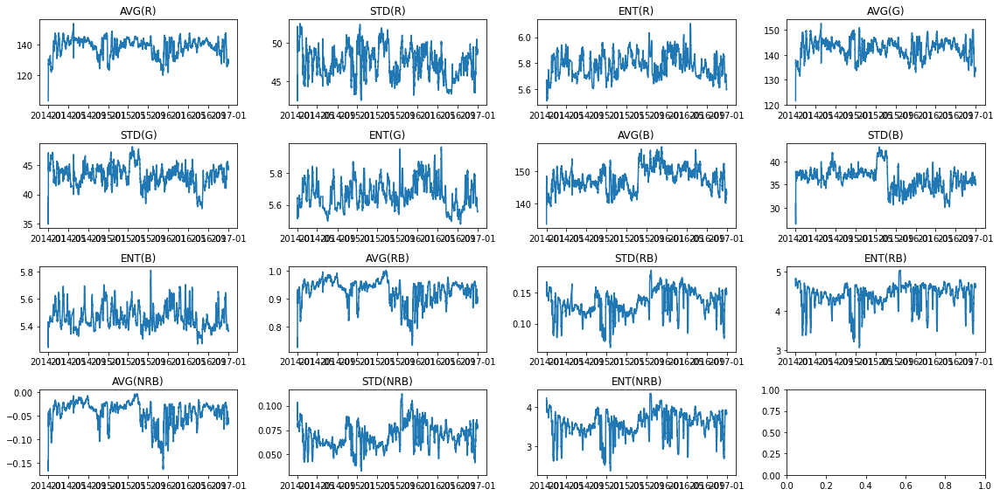

In [23]:
fig, ax = plt.subplots(4, 4, figsize=(16, 8))
ax = ax.flatten()
# quick visual check of variable temporal evolution
for index, column in enumerate(image_processed.columns[1:]):
    to_plot = to_plot = image_processed[["timestamp", column]].set_index("timestamp")
    to_plot = to_plot.rolling("7d", min_periods=1).median()
    ax[index].plot(to_plot.index, to_plot[column], label=column)
    ax[index].set_title(column)
plt.tight_layout()
plt.show()

In [24]:
print(target.shape)
for column in target.columns[1:]:
    print(column, target[target[column] > 10].shape)
# got this insider tip to filter out when the sun is not out, irradiance < 10

(1552320, 4)
ghi (751878, 4)
dni (601151, 4)
dhi (751918, 4)


In [10]:
target = target[target.dni > 10]

In [11]:
# filtered down dataset
image_processed = image_processed[image_processed.timestamp.isin(target.timeStamp)]
# lets look like at different rolling averages to see what variables might be relevant

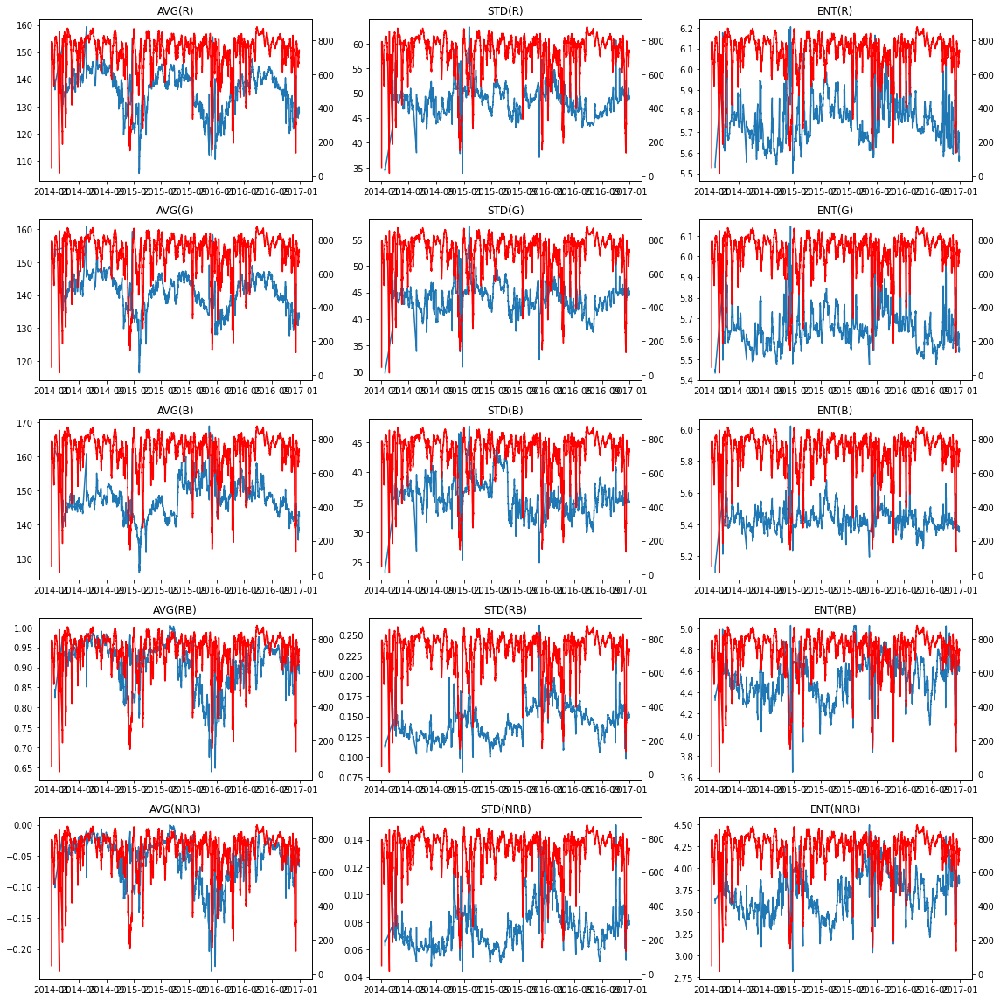

In [33]:
rolling_window = "7d"
fig, ax = plt.subplots(5, 3, figsize=(16, 16))
ax = ax.flatten()
to_plot_target = target[["timeStamp", "dni"]].set_index("timeStamp")
to_plot_target = to_plot_target.rolling(rolling_window, min_periods=1).median()

for index, column in enumerate(image_processed.columns[1:]):
    to_plot = to_plot = image_processed[["timestamp", column]].set_index("timestamp")
    to_plot = to_plot.rolling(rolling_window, min_periods=1).median()
    ax[index].plot(to_plot.index, to_plot[column])
    ax[index].set_title(column)
    ax2 = ax[index].twinx()
    ax2.plot(to_plot_target.index, to_plot_target["dni"], c="r")
plt.tight_layout()
plt.show()

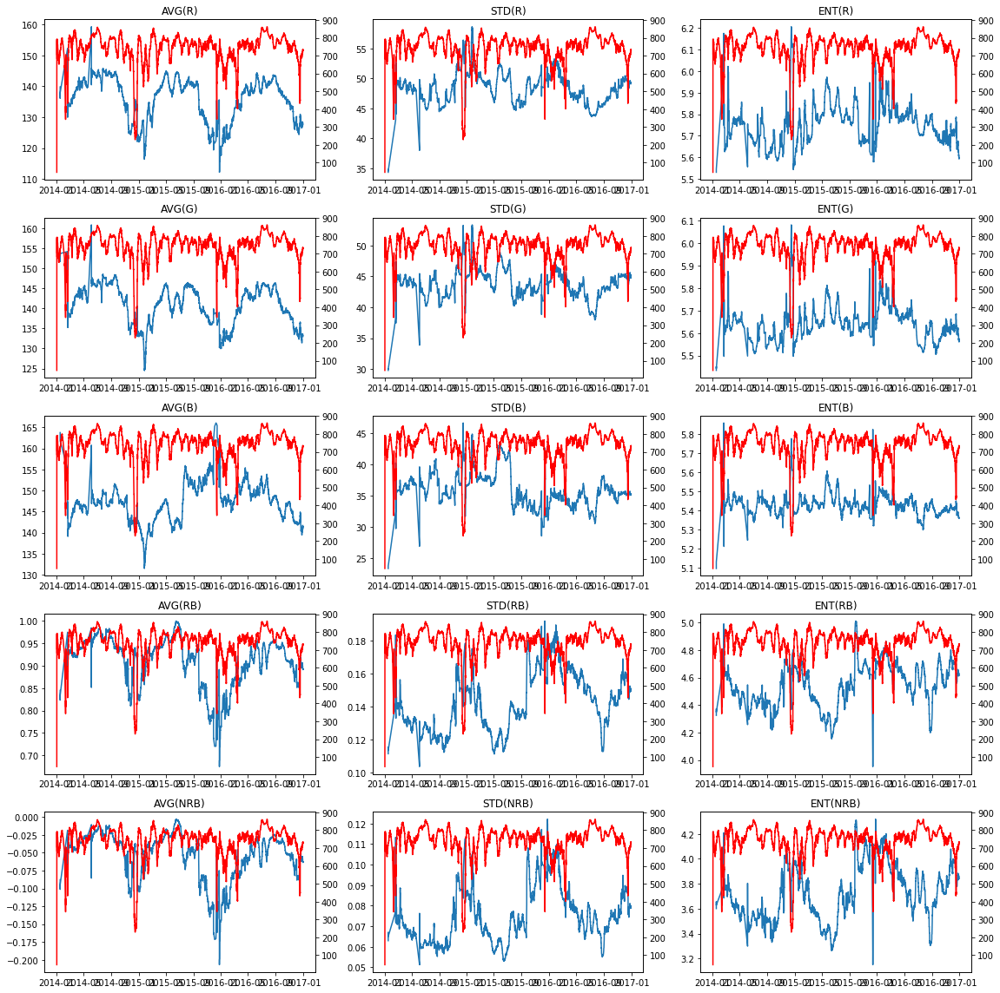

In [34]:
rolling_window = "14d"
fig, ax = plt.subplots(5, 3, figsize=(16, 16))
ax = ax.flatten()
to_plot_target = target[["timeStamp", "dni"]].set_index("timeStamp")
to_plot_target = to_plot_target.rolling(rolling_window, min_periods=1).median()

for index, column in enumerate(image_processed.columns[1:]):
    to_plot = to_plot = image_processed[["timestamp", column]].set_index("timestamp")
    to_plot = to_plot.rolling(rolling_window, min_periods=1).median()
    ax[index].plot(to_plot.index, to_plot[column])
    ax[index].set_title(column)
    ax2 = ax[index].twinx()
    ax2.plot(to_plot_target.index, to_plot_target["dni"], c="r")
plt.tight_layout()
plt.show()

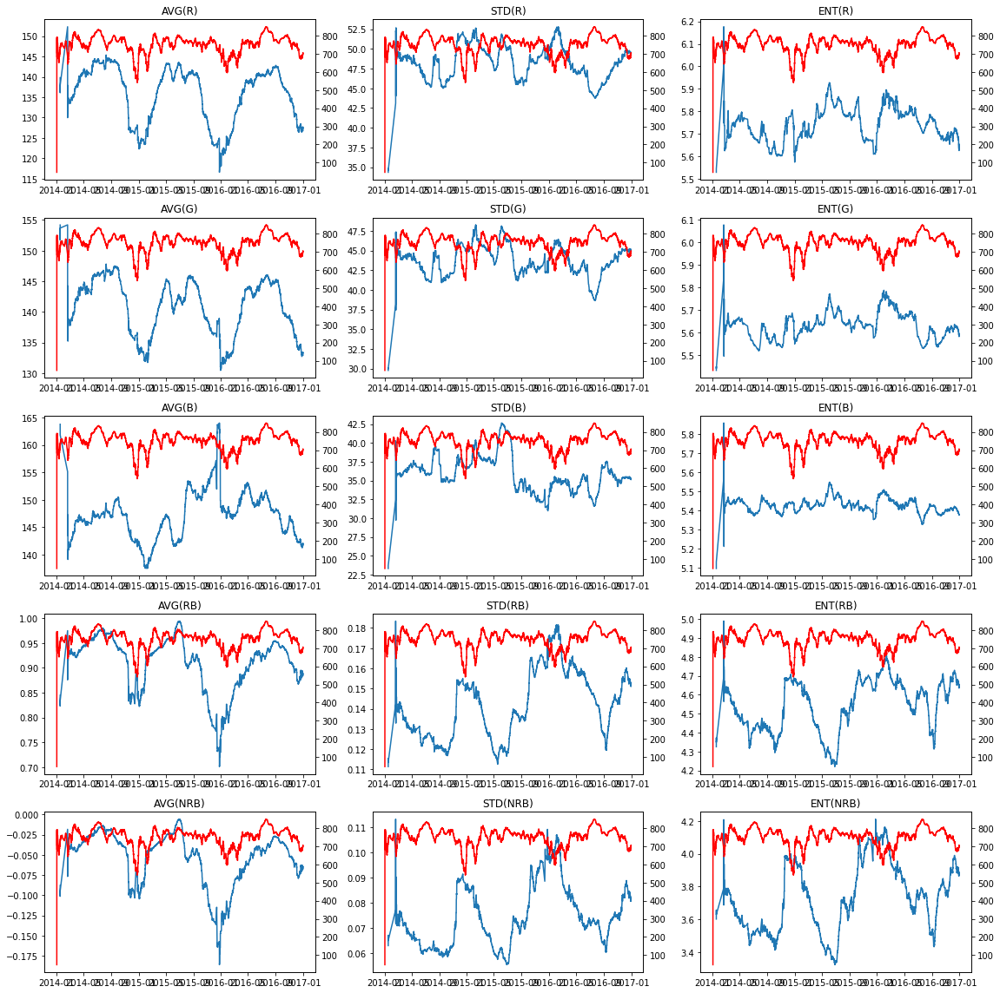

In [36]:
# pandas doesn't like using 1M as a month apparently
rolling_window = "30d"
fig, ax = plt.subplots(5, 3, figsize=(16, 16))
ax = ax.flatten()
to_plot_target = target[["timeStamp", "dni"]].set_index("timeStamp")
to_plot_target = to_plot_target.rolling(rolling_window, min_periods=1).median()

for index, column in enumerate(image_processed.columns[1:]):
    to_plot = to_plot = image_processed[["timestamp", column]].set_index("timestamp")
    to_plot = to_plot.rolling(rolling_window, min_periods=1).median()
    ax[index].plot(to_plot.index, to_plot[column])
    ax[index].set_title(column)
    ax2 = ax[index].twinx()
    ax2.plot(to_plot_target.index, to_plot_target["dni"], c="r")
plt.tight_layout()
plt.show()

In [37]:
# 14 and 30 days seem to indicate good variables but less check some more correlations

In [12]:
corr_image_processed = image_processed.corr().abs()
corr_image_processed[corr_image_processed > 0.5][
    corr_image_processed < 1
].style.background_gradient(cmap="turbo")

/tmp/ipykernel_229035/2180187986.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_image_processed = image_processed.corr().abs()


,AVG(R),STD(R),ENT(R),AVG(G),STD(G),ENT(G),AVG(B),STD(B),ENT(B),AVG(RB),STD(RB),ENT(RB),AVG(NRB),STD(NRB),ENT(NRB)
AVG(R),nan,0.557396,nan,0.891474,nan,nan,nan,nan,nan,0.735358,nan,0.656040,0.744020,0.704589,0.752347
STD(R),0.557396,nan,0.542761,0.589323,0.954356,0.575508,nan,0.775462,nan,nan,nan,nan,nan,0.670178,nan
ENT(R),nan,0.542761,nan,nan,0.537844,0.915924,nan,nan,0.653316,nan,nan,nan,nan,nan,nan
AVG(G),0.891474,0.589323,nan,nan,0.573967,nan,0.749432,nan,nan,nan,nan,0.526276,nan,0.501892,0.552288
STD(G),nan,0.954356,0.537844,0.573967,nan,0.600430,nan,0.907346,0.587079,nan,nan,nan,nan,nan,nan
ENT(G),nan,0.575508,0.915924,nan,0.600430,nan,nan,0.553868,0.838980,nan,nan,nan,nan,nan,nan
AVG(B),nan,nan,nan,0.749432,nan,nan,nan,0.559336,nan,nan,nan,nan,nan,nan,nan
STD(B),nan,0.775462,nan,nan,0.907346,0.553868,0.559336,nan,0.681482,nan,nan,nan,nan,nan,nan
ENT(B),nan,nan,0.653316,nan,0.587079,0.838980,nan,0.681482,nan,nan,nan,nan,nan,nan,nan
AVG(RB),0.735358,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.597236,0.995707,0.776699,0.769071


In [39]:
import seaborn as sns

In [13]:
full_dataset = image_processed.merge(
    target[["timeStamp", "dni"]], left_on="timestamp", right_on="timeStamp"
)

In [14]:
full_dataset.corr().abs().style.background_gradient(cmap="turbo")

/tmp/ipykernel_229035/34368115.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  full_dataset.corr().abs().style.background_gradient(cmap="turbo")


,AVG(R),STD(R),ENT(R),AVG(G),STD(G),ENT(G),AVG(B),STD(B),ENT(B),AVG(RB),STD(RB),ENT(RB),AVG(NRB),STD(NRB),ENT(NRB),dni
AVG(R),1.000000,0.557396,0.046286,0.891474,0.438775,0.103449,0.435795,0.216680,0.100386,0.735358,0.401242,0.656040,0.744020,0.704589,0.752347,0.084858
STD(R),0.557396,1.000000,0.542761,0.589323,0.954356,0.575508,0.384117,0.775462,0.498943,0.376251,0.346207,0.409716,0.404396,0.670178,0.465653,0.073997
ENT(R),0.046286,0.542761,1.000000,0.066560,0.537844,0.915924,0.020667,0.477771,0.653316,0.098048,0.196714,0.008575,0.115422,0.376702,0.050410,0.247128
AVG(G),0.891474,0.589323,0.066560,1.000000,0.573967,0.130311,0.749432,0.425575,0.165469,0.388770,0.313099,0.526276,0.402937,0.501892,0.552288,0.009567
STD(G),0.438775,0.954356,0.537844,0.573967,1.000000,0.600430,0.495334,0.907346,0.587079,0.162723,0.210376,0.220831,0.187526,0.465143,0.252208,0.053899
ENT(G),0.103449,0.575508,0.915924,0.130311,0.600430,1.000000,0.085571,0.553868,0.838980,0.111455,0.171387,0.049498,0.132157,0.367338,0.022992,0.317266
AVG(B),0.435795,0.384117,0.020667,0.749432,0.495334,0.085571,1.000000,0.559336,0.226979,0.276517,0.058479,0.142444,0.256578,0.028217,0.053516,0.090891
STD(B),0.216680,0.775462,0.477771,0.425575,0.907346,0.553868,0.559336,1.000000,0.681482,0.137533,0.004241,0.091623,0.118198,0.137568,0.084520,0.075511
ENT(B),0.100386,0.498943,0.653316,0.165469,0.587079,0.838980,0.226979,0.681482,1.000000,0.020128,0.035087,0.193583,0.002905,0.177293,0.130707,0.346278
AVG(RB),0.735358,0.376251,0.098048,0.388770,0.162723,0.111455,0.276517,0.137533,0.020128,1.000000,0.400832,0.597236,0.995707,0.776699,0.769071,0.043627


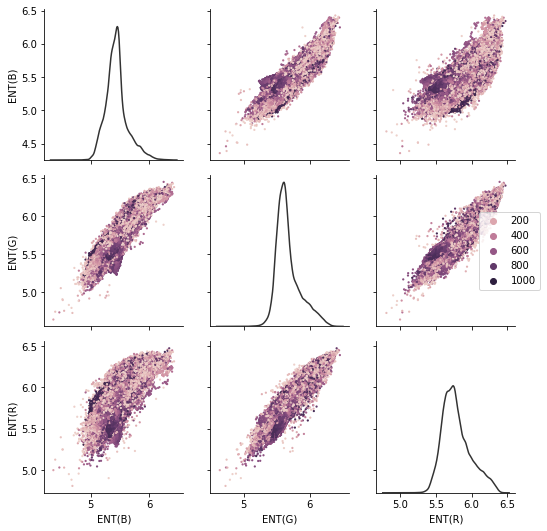

In [53]:
# chosing the 3 most correlated vars, all have the same name to check pairplot
g = sns.PairGrid(full_dataset, vars=["ENT(B)", "ENT(G)", "ENT(R)"])
g.map_diag(sns.kdeplot, color=".2")
g.map_offdiag(sns.scatterplot, hue=full_dataset["dni"], s=5, linewidth=0)
g.axes[1, -1].legend(loc="center left", bbox_to_anchor=(0.7, 0.5))

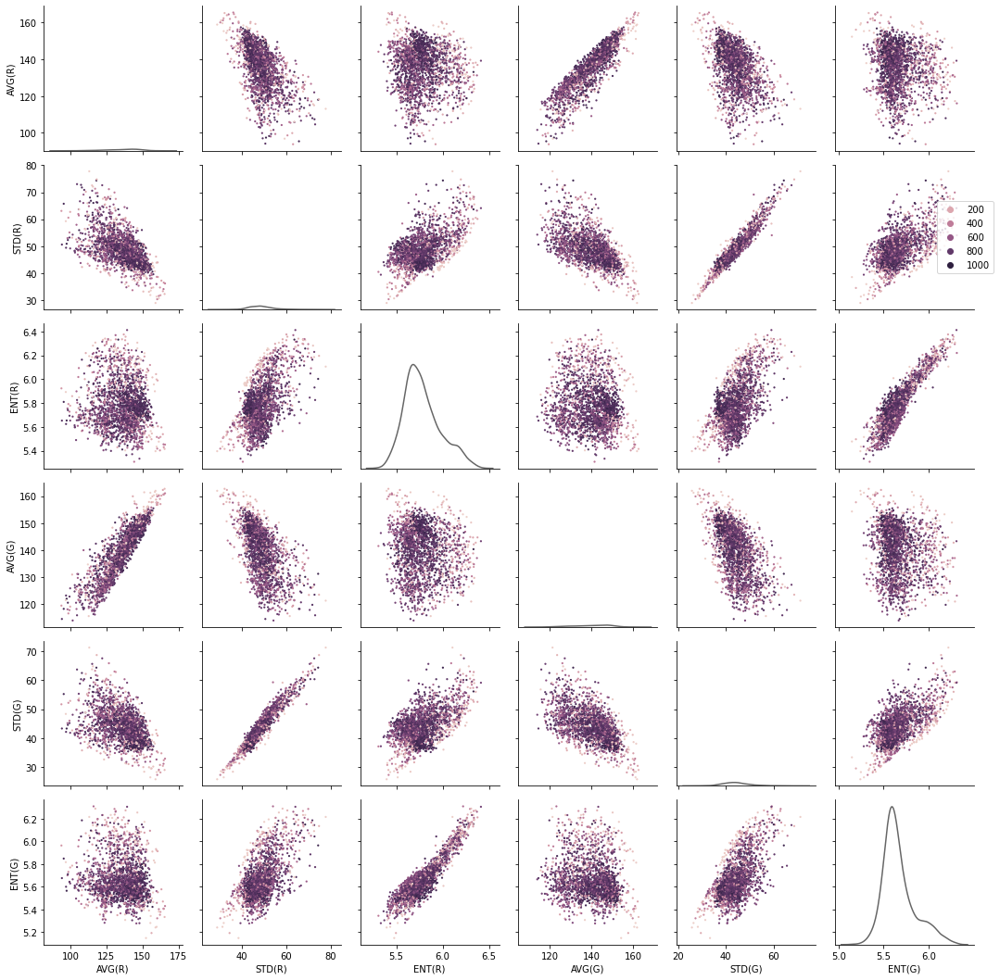

In [59]:
pairplots = sns.PairGrid(
    full_dataset.sample(2000),
    vars=["AVG(R)", "STD(R)", "ENT(R)", "AVG(G)", "STD(G)", "ENT(G)"],
)
pairplots.map_diag(sns.kdeplot, color=".4")
pairplots.map_offdiag(sns.scatterplot, hue=full_dataset["dni"], s=5, linewidth=0)
pairplots.axes[1, -1].legend(loc="center left", bbox_to_anchor=(0.7, 0.5))

In [60]:
# No quick easy win, as expected since the problem seemed to be quite hard

After looking at the data we can see there is no very direct correlation, I focused on the dataset that was derived from images so I will attemp at classification using that.
If it works it means that images contain good information to actually analyse the problem and should be investigated further.

As instructed in the brief I will use 2014-15 to train and 2016 to test and construct training examples with no future data. Keep in mind I want to predict irradiance for the next half hour in 1 minute increments.

As a start I will use just the values from the current timestamp to predict 30 min in the future, producing more test examples looking at the last X minutes of data might be a good approach.

In [61]:
# construct train data

In [15]:
train_data = full_dataset[full_dataset.timeStamp.dt.year < 2016]
test_data = full_dataset[full_dataset.timeStamp.dt.year >= 2016]

In [16]:
train_data.shape, test_data.shape

((155332, 18), (59639, 18))

In [67]:
# Lest try a multiouput regressor, seems to be a good fit for the problem

In [33]:
import sklearn
from sklearn.linear_model import LinearRegression

In [106]:
train_data.head()

,timestamp,AVG(R),STD(R),ENT(R),AVG(G),STD(G),ENT(G),AVG(B),STD(B),ENT(B),AVG(RB),STD(RB),ENT(RB),AVG(NRB),STD(NRB),ENT(NRB),timeStamp,dni
0,2014-01-17 15:37:00,139.7888,34.3469,5.5304,154.1869,29.7720,5.4339,163.7680,23.3183,5.0968,0.8448,0.1114,4.3251,-0.0879,0.0630,3.6009,2014-01-17 15:37:00,46.88
1,2014-01-17 15:38:00,133.1488,34.8151,5.5435,149.2535,30.1141,5.4508,159.8671,23.7961,5.1428,0.8232,0.1163,4.3841,-0.1013,0.0673,3.6742,2014-01-17 15:38:00,94.20
2,2014-01-17 15:39:00,136.0932,35.1223,5.5585,153.1696,30.0517,5.4555,163.9541,23.6320,5.1200,0.8206,0.1155,4.3722,-0.1028,0.0671,3.6560,2014-01-17 15:39:00,138.80
3,2014-01-17 15:40:00,149.9179,33.4076,5.5482,155.7923,29.9247,5.4337,159.0996,24.1299,5.1478,0.9358,0.0994,4.2024,-0.0358,0.0511,3.3432,2014-01-17 15:40:00,178.10
4,2014-02-19 15:44:00,152.3175,43.1066,6.0047,154.2093,38.1726,5.8385,155.1190,32.4359,5.5685,0.9747,0.1425,4.6965,-0.0184,0.0773,3.7903,2014-02-19 15:44:00,28.88


In [17]:
train_X = train_data[
    [
        "AVG(R)",
        "STD(R)",
        "ENT(R)",
        "AVG(G)",
        "STD(G)",
        "ENT(G)",
        "AVG(B)",
        "STD(B)",
        "ENT(B)",
        "AVG(RB)",
        "STD(RB)",
        "ENT(RB)",
        "AVG(NRB)",
        "STD(NRB)",
        "ENT(NRB)",
    ]
]

In [18]:
train_Y = train_data[["timestamp", "dni"]]

In [24]:
train_target = [
    train_Y.iloc[i : i + 30]["dni"].values for i in range(len(train_Y) - 30)
]

In [110]:
len(train_target), len(train_X)

(155302, 155332)

In [111]:
# we lose the last 30 minutes of data due to wanting to stack examples
train_X = train_X[:-30]

In [112]:
len(train_target), len(train_X)

(155302, 155302)

In [114]:
from sklearn.linear_model import LinearRegression
first_model = LinearRegression()

In [115]:
first_model.fit(train_X, train_target)

LinearRegression()

In [19]:
from sklearn import metrics

In [125]:
y_predicted = first_model.predict(train_X)

mae = metrics.mean_absolute_error(train_target, y_predicted)
mse = metrics.mean_squared_error(train_target, y_predicted)
r2 = metrics.r2_score(train_target, y_predicted)

print("The model performance for testing set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

The model performance for testing set
--------------------------------------
MAE is 151.1144044345185
MSE is 39723.9587803872
R2 score is 0.3829785607982642


In [126]:
# a first attempt, and what a bad one!! R2 of 0.38 is not a good one sadly
# this is looking at the whole 30 min interval at once, could be interesting to dissect it further
# given this performance testing it on the 2016 data seemed pointless

In [20]:
from sklearn.ensemble import RandomForestRegressor

In [129]:
second_model = RandomForestRegressor()
second_model.fit(train_X, train_target)
y_predicted = second_model.predict(train_X)

mae = metrics.mean_absolute_error(train_target, y_predicted)
mse = metrics.mean_squared_error(train_target, y_predicted)
r2 = metrics.r2_score(train_target, y_predicted)

print("The model performance for testing set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

The model performance for testing set
--------------------------------------
MAE is 27.934698551531643
MSE is 2380.681520738079
R2 score is 0.9630214252151232


In [ ]:
# Very different case with a R2 score that probably indicates severe overfitting
# I will bit and see what it looks like for the 2016 data

In [ ]:
# lets build our datasets as we did previously

In [21]:
test_X = test_data[
    [
        "AVG(R)",
        "STD(R)",
        "ENT(R)",
        "AVG(G)",
        "STD(G)",
        "ENT(G)",
        "AVG(B)",
        "STD(B)",
        "ENT(B)",
        "AVG(RB)",
        "STD(RB)",
        "ENT(RB)",
        "AVG(NRB)",
        "STD(NRB)",
        "ENT(NRB)",
    ]
]

In [22]:
test_Y = test_data[["timestamp", "dni"]]

In [23]:
test_target = [
    test_Y.iloc[i : i + 30]["dni"].values for i in range(len(test_Y) - 30)
]

In [133]:
len(test_target), len(test_X)

(59609, 59639)

In [134]:
# we lose the last 30 minutes of data due to wanting to stack examples
test_X = test_X[:-30]

In [135]:
len(test_target), len(test_X)

(59609, 59609)

In [136]:
y_predicted = second_model.predict(test_X)

mae = metrics.mean_absolute_error(test_target, y_predicted)
mse = metrics.mean_squared_error(test_target, y_predicted)
r2 = metrics.r2_score(test_target, y_predicted)

print("The model performance for testing set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

The model performance for testing set
--------------------------------------
MAE is 152.13548526877938
MSE is 41988.599555154826
R2 score is 0.36701165707100575


In [ ]:
# as expected the model is severly overfitting to the training data and not generalising well

In [ ]:
# given I had the code why not inspect the first model...

In [137]:
y_predicted = first_model.predict(test_X)

mae = metrics.mean_absolute_error(test_target, y_predicted)
mse = metrics.mean_squared_error(test_target, y_predicted)
r2 = metrics.r2_score(test_target, y_predicted)

print("The model performance for testing set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

The model performance for testing set
--------------------------------------
MAE is 158.15315481427191
MSE is 47679.15038543434
R2 score is 0.28122051062756576


In [138]:
# performs even worse than the overfitted model

In [139]:
# first try to solve the overfit is to reduce the number of estimators that defaults to 100

In [140]:
second_model = RandomForestRegressor(n_estimators=10)
second_model.fit(train_X, train_target)
y_predicted = second_model.predict(train_X)

mae = metrics.mean_absolute_error(train_target, y_predicted)
mse = metrics.mean_squared_error(train_target, y_predicted)
r2 = metrics.r2_score(train_target, y_predicted)

print("The model performance for training set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

y_predicted = second_model.predict(test_X)

mae = metrics.mean_absolute_error(test_target, y_predicted)
mse = metrics.mean_squared_error(test_target, y_predicted)
r2 = metrics.r2_score(test_target, y_predicted)

print("The model performance for testing set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

The model performance for training set
--------------------------------------
MAE is 31.637146191936097
MSE is 3530.1626718801813
R2 score is 0.9451668117824664
The model performance for testing set
--------------------------------------
MAE is 156.95940453678682
MSE is 45579.18583755054
R2 score is 0.31288409342496115


In [141]:
# once again, "incredible" performance in train, not so much in test

In [144]:
# lets also reduce the depth of the trees
second_model = RandomForestRegressor(n_estimators=10, max_depth=20)
second_model.fit(train_X, train_target)
y_predicted = second_model.predict(train_X)

mae = metrics.mean_absolute_error(train_target, y_predicted)
mse = metrics.mean_squared_error(train_target, y_predicted)
r2 = metrics.r2_score(train_target, y_predicted)

print("The model performance for training set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

y_predicted = second_model.predict(test_X)

mae = metrics.mean_absolute_error(test_target, y_predicted)
mse = metrics.mean_squared_error(test_target, y_predicted)
r2 = metrics.r2_score(test_target, y_predicted)

print("The model performance for testing set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

The model performance for training set
--------------------------------------
MAE is 58.08567806684584
MSE is 8708.873466662211
R2 score is 0.8647268812563774
The model performance for testing set
--------------------------------------
MAE is 150.71641823792714
MSE is 44185.48687279728
R2 score is 0.3338933184699356


In [145]:
# still no silver bullet
# I have had good results with GradientBoosting in the past, perhaps...

In [151]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.multioutput import MultiOutputRegressor
third_model = MultiOutputRegressor(GradientBoostingRegressor(verbose=0, n_estimators=20))
third_model.fit(train_X, train_target)
y_predicted = third_model.predict(train_X)

mae = metrics.mean_absolute_error(train_target, y_predicted)
mse = metrics.mean_squared_error(train_target, y_predicted)
r2 = metrics.r2_score(train_target, y_predicted)

print("The model performance for training set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

y_predicted = third_model.predict(test_X)

mae = metrics.mean_absolute_error(test_target, y_predicted)
mse = metrics.mean_squared_error(test_target, y_predicted)
r2 = metrics.r2_score(test_target, y_predicted)

print("The model performance for testing set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

The model performance for training set
--------------------------------------
MAE is 162.90189369587523
MSE is 43088.00211632447
R2 score is 0.33072860236354384
The model performance for testing set
--------------------------------------
MAE is 170.71213372328984
MSE is 47574.07530654866
R2 score is 0.282831701582572


In [152]:
# still no silver bullet, problem is indeed hard to solve!
# as a last hail mary I will try to wrap the random forest regressor into the multioutput regressor
# this means an estimator per output instead of a general one

In [154]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.multioutput import MultiOutputRegressor
fourth_model = MultiOutputRegressor(RandomForestRegressor(verbose=1, n_estimators=10, n_jobs=8))
fourth_model.fit(train_X, train_target)
y_predicted = fourth_model.predict(train_X)

mae = metrics.mean_absolute_error(train_target, y_predicted)
mse = metrics.mean_squared_error(train_target, y_predicted)
r2 = metrics.r2_score(train_target, y_predicted)

print("The model performance for training set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

y_predicted = fourth_model.predict(test_X)

mae = metrics.mean_absolute_error(test_target, y_predicted)
mse = metrics.mean_squared_error(test_target, y_predicted)
r2 = metrics.r2_score(test_target, y_predicted)

print("The model performance for testing set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    4.4s remaining:    2.9s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    6.7s finished
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    2.9s remaining:    1.9s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    5.4s finished
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    2.9s remaining:    2.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    5.4s finished
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    3.0s remaining:    2.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    5.5s finished
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Don

[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s


The model performance for training set
--------------------------------------
MAE is 31.63654642910829
MSE is 3529.971010159968
R2 score is 0.9451697207423221


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


The model performance for testing set
--------------------------------------
MAE is 157.42195742589183
MSE is 45818.02723249825
R2 score is 0.30928208293217996


In [155]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.multioutput import MultiOutputRegressor
fourth_model = MultiOutputRegressor(RandomForestRegressor(verbose=0, n_estimators=5, n_jobs=8))
fourth_model.fit(train_X, train_target)
y_predicted = fourth_model.predict(train_X)

mae = metrics.mean_absolute_error(train_target, y_predicted)
mse = metrics.mean_squared_error(train_target, y_predicted)
r2 = metrics.r2_score(train_target, y_predicted)

print("The model performance for training set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

y_predicted = fourth_model.predict(test_X)

mae = metrics.mean_absolute_error(test_target, y_predicted)
mse = metrics.mean_squared_error(test_target, y_predicted)
r2 = metrics.r2_score(test_target, y_predicted)

print("The model performance for testing set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

The model performance for training set
--------------------------------------
MAE is 34.03842106219094
MSE is 4792.456770904482
R2 score is 0.925559791545919
The model performance for testing set
--------------------------------------
MAE is 162.79992482455117
MSE is 50019.57938298719
R2 score is 0.24594398044542942


In [ ]:
# Nothing still, big train overfit, test not performing

### Way forward and considerations

None of the quick classical approaches worked, although some might have shown some promise. It overall seems that predicting general 2weeks+ trends wouldn't be difficult but the situation is much trickier when looking at minute by minute changes.

During my exploration given to the constraint of the time I made a guesstimate on what dataset could have given me the best return for time invested. I got good tips about solar positions + energy that I could have incorporated.

With more time available looking at other datasets and combining them would be next on the list. I would also like to try some image classification methods given my experience with CNNs and my desire to apply transformer based models to image classification.

Although no classifier performed well at all it was a very interesting dataset and exercise to go through and it shows that some problems are much harder to solve than what they seem to be at a glance.

In [ ]:
# new attemp, folding in more data, lets say 30 minutes prior

In [25]:
train_historical = [
    train_X.iloc[i : i + 30].values.flatten() for i in range(len(train_X) - 30)
]

In [26]:
test_historical = [
    test_X.iloc[i : i + 30].values.flatten() for i in range(len(test_X) - 30)
]

In [27]:
len(train_target), len(train_historical)

(155302, 155302)

In [28]:
len(test_target), len(test_historical)

(59609, 59609)

In [29]:
historical_model = RandomForestRegressor(verbose=1, n_estimators=10)
historical_model.fit(train_historical, train_target)

y_predicted = historical_model.predict(train_historical)

mae = metrics.mean_absolute_error(train_target, y_predicted)
mse = metrics.mean_squared_error(train_target, y_predicted)
r2 = metrics.r2_score(train_target, y_predicted)

print("The model performance for training set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

y_predicted = historical_model.predict(test_historical)

mae = metrics.mean_absolute_error(test_target, y_predicted)
mse = metrics.mean_squared_error(test_target, y_predicted)
r2 = metrics.r2_score(test_target, y_predicted)

print("The model performance for testing set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  2.8min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


The model performance for training set
--------------------------------------
MAE is 31.408151944812914
MSE is 10791.431691995518
R2 score is 0.8323812211296473


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


The model performance for testing set
--------------------------------------
MAE is 155.23592459192406
MSE is 58485.75992749478
R2 score is 0.11835087431756834


In [30]:
historical_model = RandomForestRegressor(verbose=1, n_estimators=10)
historical_model.fit(train_historical, train_target)

y_predicted = historical_model.predict(train_historical)

mae = metrics.mean_absolute_error(train_target, y_predicted)
mse = metrics.mean_squared_error(train_target, y_predicted)
r2 = metrics.r2_score(train_target, y_predicted)

print("The model performance for training set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

y_predicted = historical_model.predict(test_historical)

mae = metrics.mean_absolute_error(test_target, y_predicted)
mse = metrics.mean_squared_error(test_target, y_predicted)
r2 = metrics.r2_score(test_target, y_predicted)

print("The model performance for testing set")
print("--------------------------------------")
print("MAE is {}".format(mae))
print("MSE is {}".format(mse))
print("R2 score is {}".format(r2))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed: 28.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.6s finished


The model performance for training set
--------------------------------------
MAE is 24.447988412041187
MSE is 2274.6796314844123
R2 score is 0.9646683529827272


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


The model performance for testing set
--------------------------------------
MAE is 113.90549603862961
MSE is 28571.561076243266
R2 score is 0.5692949208747057


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.3s finished
